<a id='Top of Contents'></a>
## 3. Multiple Linear Regression Analysis

In this chapter, I choose arbitratily five features; Ball Possession, Passes, Pass Accuracy, On-Target, and Distance Covered to predict the response variable, Attempts, the number of shot attempts by a team.

In [2]:
# Import libraries

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno

import plotly.express as px
import plotly.graph_objects as go

import rfpimp
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR

import statsmodels.formula.api as smf
from scipy import stats

C:\Users\james\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.ensemble.forest module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
  warnings.warn(message, FutureWarning)


In [3]:
# Define working directory
os.chdir("C:/Users/james/Desktop/Coding/Kaggle/FIFA 2018")

# Import csv file
df = pd.read_csv("FIFA 2018.csv")

In [4]:
# Fill missing values in 1st Goal with 0
df["1st Goal"].fillna(0)

# Print missing values only in both columns
og = ["Own goals", "Own goal Time"]
og_null = df.loc[df["Own goals"].isna(), og]

df.loc[og_null.index, og]
df.loc[og_null.index, og].head()

# Fill missing values with 0
df.loc[og_null.index, og].fillna(0)

,Own goals,Own goal Time
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
5,0.0,0.0
...,...,...
122,0.0,0.0
123,0.0,0.0
124,0.0,0.0
125,0.0,0.0


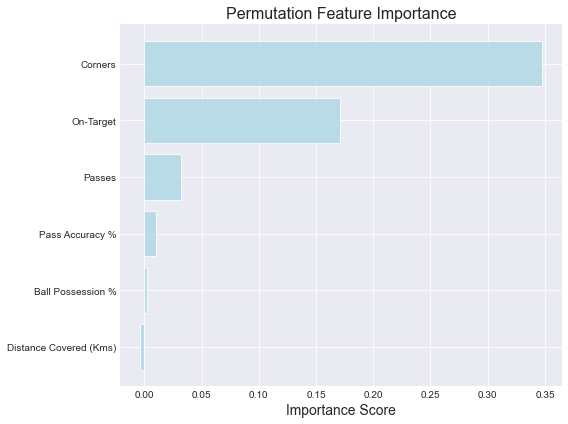

In [7]:
features = ['Ball Possession %', 'Passes', 'Pass Accuracy %', 'On-Target', 'Distance Covered (Kms)', 
            'Corners','Attempts']

# Training / test data split
df_train, df_test = train_test_split(df, test_size=0.20)
df_train = df_train[features]
df_test = df_test[features]

X_train, y_train = df_train.drop('Attempts', axis=1), df_train['Attempts']
X_test, y_test = df_test.drop('Attempts', axis=1), df_test['Attempts']
                                                               
# Training data
rf = RandomForestRegressor(n_estimators=100, n_jobs=-1)
rf.fit(X_train, y_train)

# Permutation feature importance
imp = rfpimp.importances(rf, X_test, y_test)

# Plot
plt.style.use('seaborn-darkgrid')
fig, ax = plt.subplots(figsize=(8, 6))

ax.barh(imp.index, imp['Importance'], height=0.8, facecolor='lightblue', alpha=0.8, edgecolor='white')
ax.set_xlabel('Importance Score', fontsize=14)
ax.set_title('Permutation Feature Importance', fontsize=16)
plt.gca().invert_yaxis()
fig.tight_layout()

Based on the permutation feature imporances shown above, On-Target (the total number of shots on-target) is the most important feature, and Corners (the total number of corner shots used) is the second most important feature.

In [8]:
# Visualizing coefficients for multiple linear regression (MLR)

X = df[['Ball Possession %', 'Passes', 'Pass Accuracy %', 'On-Target', 'Distance Covered (Kms)', 'Corners']]
X = pd.get_dummies(X)
y = df['Attempts']

model = LinearRegression()
model.fit(X, y)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors, color_discrete_sequence=['dodgerblue', 'deeppink'],
    labels=dict(x='Features', y='Linear coefficient'), 
    title='Weight of each feature for predicting Number of Shot attempts')
fig.show()

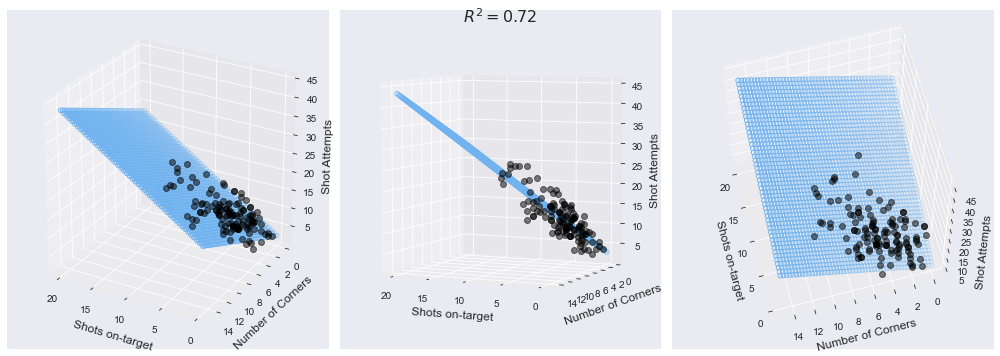

In [9]:
from mpl_toolkits.mplot3d import Axes3D

# Data preparation
X = df[['On-Target', 'Corners']].values.reshape(-1, 2)
Y = df['Attempts']

# Prepare model data point for visualization
x = X[:, 0]
y = X[:, 1]
z = Y

x_pred = np.linspace(0, 20, 50) # range of On-Target values
y_pred = np.linspace(0, 15, 50) # range of Corners values
xx_pred, yy_pred = np.meshgrid(x_pred, y_pred)
model_viz = np.array([xx_pred.flatten(), yy_pred.flatten()]).T

# Train 
ols = linear_model.LinearRegression()
model = ols.fit(X, Y)
predicted = model.predict(model_viz)

# Evaluate the model
r2 = model.score(X, Y)

# Plot the model
plt.style.use('seaborn-darkgrid')

fig = plt.figure(figsize=(14, 5))

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

axes = [ax1, ax2, ax3]

for ax in axes:
    ax.plot(x, y, z, color='k', zorder=15, linestyle='none', marker='o', alpha=0.5)
    ax.scatter(xx_pred.flatten(), yy_pred.flatten(), predicted, facecolor=(0, 0, 0, 0), s=20, edgecolor='#70b3f0')
    ax.set_xlabel('Shots on-target', fontsize=12)
    ax.set_ylabel('Number of Corners', fontsize=12)
    ax.set_zlabel('Shot Attempts', fontsize=12)
    ax.locator_params(nbins=4, axis='x')
    ax.locator_params(nbins=5, axis='x')

ax1.view_init(elev=25, azim=120)
ax2.view_init(elev=5, azim=115)
ax3.view_init(elev=60, azim=165)
    
fig.suptitle('$R^2 = %.2f$' % r2, fontsize=16)

fig.tight_layout()

In [10]:
# Create 360 different plots viewed from different angles with the following code snippet, 
# and combined into a single gif from ezgif.com.
for ii in np.arange(0, 360, 1):
    ax.view_init(elev=32, azim=ii)
    fig.savefig('gif_image%d.png' % ii)

In [12]:
# 3D regression 2 with px.scatter_3d and go.Surface

mesh_size= .02
margin = 0

df['On_target'] = df['On-Target'].rename()

X = df[['On_target', 'Corners']]
y = df['Attempts']

# Condition the model on On-Target and Corners, predict Attempts
model = SVR(C=1.)
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.On_target.min() - margin, X.On_target.max() + margin
y_min, y_max = X.Corners.min() - margin, X.Corners.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='On_target', y='Corners', z='Attempts')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface'))
fig.show()